#### SASA-defined curvature

In [5]:
plt.rcParams['figure.dpi'] = 1200

Try and distinguish between concave/planar/convex epitopes by solvent accessibility
- Use SASA-defined epitopes
- Get SASA values for residues in unbound epitope 
- Get surface area of epitope residues
- Get value for sum of SASA values/surface area for each epitope 
- compare distributions of these values for Abs and sdAbs
- test correlation with mean VD values (is there a relationship between solvent accessibility and curvature as defined by VD)

https://pymolwiki.org/index.php/Get_area

In [2]:
import pandas as pd
from pymol import cmd
import numpy as np 

Feature has expired.
Feature:       PYMOL_MAIN
Expire date:   01-jun-2022
License path:  /Users/gemmagordon/.pymol/license.lic:/Library/Application Support/Schrodinger/licenses:
FlexNet Licensing error:-10,32


In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
import dabest
from statsmodels.stats.weightstats import ztest as ztest

#### Run for all complexes

In [6]:
abs_summary = pd.read_csv('/Users/gemmagordon/Documents/OXFORD/OPIG YEAR 1/BindingSiteProject/henriette/vhh-vh-epitope-comparison/Dataset_flAbs_summary.csv')
sdabs_summary = pd.read_csv('/Users/gemmagordon/Documents/OXFORD/OPIG YEAR 1/BindingSiteProject/henriette/vhh-vh-epitope-comparison/Dataset_sdAbs_summary.csv')

In [7]:
abs_filepath = '/Users/gemmagordon/Documents/OXFORD/OPIG YEAR 1/BindingSiteProject/nbs_vs_abs/BindingSiteComparison_ipynbs_in_paper/vertex_defects_analysis/temp_pdb_cif_abs'
sdabs_filepath = '/Users/gemmagordon/Documents/OXFORD/OPIG YEAR 1/BindingSiteProject/nbs_vs_abs/BindingSiteComparison_ipynbs_in_paper/vertex_defects_analysis/temp_pdb_cif_nbs'

In [130]:
def get_sasa_binding_site(pdb, summary_file, data_dir, ab, ag):

    results = []

    # ab_chains = [chains for chains in summary_file['antibody_chain'].loc[summary_file['pdb'] == pdb]]
    # ag_chains = [chains for chains in summary_file['antigen_chain'].loc[summary_file['pdb'] == pdb]] # NOTE bug auth codes PDB

    # for ab, ag in zip(ab_chains, ag_chains):

    #print(ab, ag)
    all_chains = [ab,ag]
    print(all_chains)
    all_chains_dict = {'Ab':ab, 'Ag':ag}
    print(all_chains_dict)
    
    cmd.reinitialize()
    pdbfile = str(data_dir + '/' + pdb + '.cif')
    
    try:
        cmd.load(pdbfile)
    except:
        cmd.fetch(pdb)

    # remove irrelevant chains and overwrite pdb to only include
    print('relevant_chains', str(pdb + ' and chain ' + '+'.join([a for a in all_chains])))
    cmd.extract('relevant_chains', str(pdb + ' and chain ' + '+'.join([a for a in all_chains]))) # auth codes
    #print('Ag', str('relevant_chains' + ' and chain ' + '+'.join([a for a in ag])))
    print('Ag', str('relevant_chains' + ' and chain ' + ag))
    cmd.create('Ag', str('relevant_chains' + ' and chain ' + ag))
    # cmd.create('Ag', str('relevant_chains' + ' and chain ' + '+'.join([a for a in ag]))) # separate Ag object

    sasa_ag = cmd.get_sasa_relative('Ag')
    sasa_complex = cmd.get_sasa_relative('relevant_chains')

    sasa_ag_df, sasa_complex_df = pd.DataFrame(), pd.DataFrame()
    #sasa_ab_df['res_id'], sasa_ab_df['sasa_unbound'] = [i[2:4] for i in sasa_ab.keys()], [j for j in sasa_ab.values()]
    sasa_ag_df['res_id'], sasa_ag_df['sasa_unbound'] = [i[2:4] for i in sasa_ag.keys()], [j for j in sasa_ag.values()]
    sasa_complex_df['res_id'], sasa_complex_df['sasa_bound'] = [i[2:4] for i in sasa_complex.keys()], [j for j in sasa_complex.values()]
    sasa_df = sasa_complex_df.merge(sasa_ag_df, how='outer', on='res_id')

    # NOTE res_id, 1st character is chain, 2nd is pymol residue num
    sasa_filter = sasa_df.loc[sasa_df['sasa_bound'] < sasa_df['sasa_unbound']]
    #print(sasa_filter) # residues where bound SASA is lower than unbound SASA and so residue must become more buried

    # get surface area
    epitope_res = list([r[1] for r in sasa_filter['res_id']])
    print(epitope_res)
    cmd.create('Epitope', str('Ag and resi ' + '+'.join(epitope_res)))
    epitope_area = cmd.get_area('Epitope')

    results.append([pdb, np.sum(sasa_filter['sasa_unbound']), epitope_area])

    return results

In [133]:
failed_sdabs = pd.DataFrame()
failed_sdabs['pdb'] = ['7oau','7oaq','7oaq','7oay','7nmu','7b27','7nkt']
failed_sdabs['ab_chain'] = ['BBB','AAA','FFF','AAA','AAA','AAA','AAA']
failed_sdabs['ag_chain'] = ['AAA','EEE','EEE','BBB','CCC','CCC','BBB']

In [145]:
failed_abs = pd.DataFrame()
failed_abs['pdb'] = ['4dn4','6yax','6t9d','6ss4','6ss2']
failed_abs['ab_chain'] = ['A+B','III+MMM','AAA+BBB','HHH+LLL','HHH+LLL']
failed_abs['ag_chain'] = ['C','BBB','DDD','AAA','AAA']

In [147]:
## NOTE can't debug 4dn4? 

In [6]:
abs_results = []
failed_abs = []

for i, row in enumerate(abs_summary.iterrows()):
    try:
        results = get_sasa_binding_site(row[1]['pdb'], abs_summary, abs_filepath)
        for r in results:
            abs_results.append(r)
    except:
        failed_abs.append(row)

 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLo

In [148]:
abs_results = []

for i, row in enumerate(failed_abs.iterrows()):
    if row[1]['pdb'] != '4dn4':
    #     print(row)
        results = get_sasa_binding_site(row[1]['pdb'], abs_summary, abs_filepath, row[1]['ab_chain'], row[1]['ag_chain'])
        abs_results.append(results)
    # for r in results:
    #     print(r)

    # try:
    #     results = get_sasa_binding_site(row[1]['pdb'], sdabs_summary, sdabs_filepath)
    #     for r in results:
    #         sdabs_results.append(r)
    # except:
    #     failed_sdabs.append(row)

['III+MMM', 'BBB']
{'Ab': 'III+MMM', 'Ag': 'BBB'}
 ExecutiveLoad-Detail: Detected mmCIF
relevant_chains 6yax and chain III+MMM+BBB
Ag relevant_chains and chain BBB
         res_id  sasa_bound  sasa_unbound
456   (BBB, 63)    0.225022      0.288151
523  (BBB, 130)    0.470932      0.529294
524  (BBB, 131)    0.247091      0.250206
525  (BBB, 132)    0.029275      0.340686
548  (BBB, 155)    0.096041      0.232024
549  (BBB, 156)    0.373458      0.601432
551  (BBB, 158)    0.102381      0.264117
552  (BBB, 159)    0.745856      0.760934
555  (BBB, 162)    0.087425      0.386990
569  (BBB, 176)    0.613237      0.623062
592  (BBB, 199)    0.032516      0.170869
593  (BBB, 200)    0.000000      0.008306
594  (BBB, 201)    0.544576      0.692449
595  (BBB, 202)    0.099881      0.971358
596  (BBB, 203)    0.005427      0.517965
597  (BBB, 204)    0.221604      0.662836
598  (BBB, 205)    0.067512      0.305084
['63', '130', '131', '132', '155', '156', '158', '159', '162', '176', '199', '20

In [159]:
abs_results = [abs_results[i][0] for i in range(len(abs_results))]

In [160]:
sdabs_results = [sdabs_results[i][0] for i in range(len(sdabs_results))]

In [161]:
sdabs_results_df = pd.DataFrame()
sdabs_results_df['pdb'] = [sdabs_results[i][0] for i in range(len(sdabs_results))]
sdabs_results_df['SASA total'] = [sdabs_results[i][1] for i in range(len(sdabs_results))]
sdabs_results_df['epitope surface area'] = [sdabs_results[i][2] for i in range(len(sdabs_results))]

In [162]:
abs_results_df = pd.DataFrame()
abs_results_df['pdb'] = [abs_results[i][0] for i in range(len(abs_results))]
abs_results_df['SASA total'] = [abs_results[i][1] for i in range(len(abs_results))]
abs_results_df['epitope surface area'] = [abs_results[i][2] for i in range(len(abs_results))]

In [163]:
sdabs_results_df['SASA/SA'] = [i/j for i,j in zip(sdabs_results_df['SASA total'],sdabs_results_df['epitope surface area'])]
abs_results_df['SASA/SA'] = [i/j for i,j in zip(abs_results_df['SASA total'],abs_results_df['epitope surface area'])]

In [164]:
sdabs_results_df

,pdb,SASA total,epitope surface area,SASA/SA
0,7oau,7.595439,2603.165039,0.002918
1,7oaq,8.828282,2499.699219,0.003532
2,7oaq,8.171435,2047.789551,0.003990
3,7oay,6.688785,1793.350708,0.003730
4,7nmu,9.358638,2700.020996,0.003466
5,7b27,10.537981,3026.283447,0.003482
6,7nkt,7.162104,1833.484497,0.003906


In [176]:
sdabs_results_df = pd.read_csv('sdAbs_SASA_vs_SA.csv')
abs_results_df = pd.read_csv('Abs_SASA_vs_SA.csv')

Plot distributions of SASA/SA for Abs and sdAbs

plot without normalising for epitope size

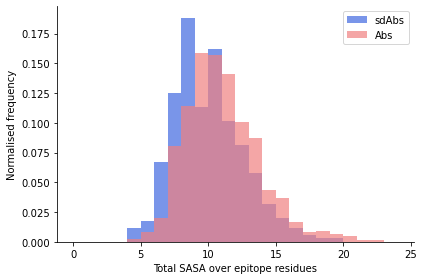

In [178]:
bins = np.arange(0, 25, 1)

plt.figure()
plt.hist(sdabs_results_df['SASA total'], bins=bins, label='sdAbs', alpha=0.7, color='royalblue', weights=np.zeros_like(sdabs_results_df['SASA total']) + 1. / len(sdabs_results_df['SASA total']))
plt.hist(abs_results_df['SASA total'], bins=bins, label='Abs', alpha=0.7, color='lightcoral', weights=np.zeros_like(abs_results_df['SASA total']) + 1. / len(abs_results_df['SASA total']))
plt.xlabel('Total SASA over epitope residues')
plt.ylabel('Normalised frequency')
plt.legend()
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

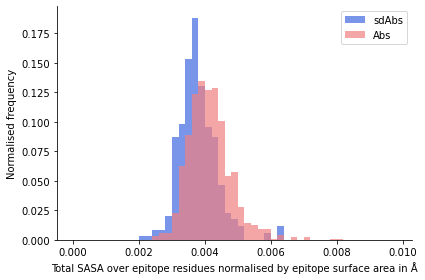

In [179]:
bins = np.arange(0, 0.01, 0.0002)

plt.figure()
plt.hist(sdabs_results_df['SASA/SA'], bins=bins, label='sdAbs', alpha=0.7, color='royalblue', weights=np.zeros_like(sdabs_results_df['SASA/SA']) + 1. / len(sdabs_results_df['SASA/SA']))
plt.hist(abs_results_df['SASA/SA'], bins=bins, label='Abs', alpha=0.7, color='lightcoral', weights=np.zeros_like(abs_results_df['SASA/SA']) + 1. / len(abs_results_df['SASA/SA']))
plt.xlabel('Total SASA over epitope residues normalised by epitope surface area in Å')
plt.ylabel('Normalised frequency')
plt.legend()
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

- slight shift in SASA for Abs to the right, suggests Abs epitopes slightly more accessible and therefore possibly slightly less concave than sdAbs? 
- is there a correlation between SASA and concavity? 

bootstrap comparison:

In [8]:
def perform_bootstrap(n_sample, interaction_sizes):
    df = pd.DataFrame([np.random.choice(interaction_sizes[k],n_sample,replace=False) for k in interaction_sizes]).T
    df.columns = [k for k in interaction_sizes]
    x = dabest.load(df, idx=(list(interaction_sizes.keys())[0],list(interaction_sizes.keys())[1]))
    print(x.mean_diff)

In [182]:
zoutput_meanvd = ztest(sdabs_results_df['SASA/SA'], abs_results_df['SASA/SA'], value=0) 
print(f"ztest continuity percentage: {zoutput_meanvd}")

ztest continuity percentage: (-8.76480186484977, 1.871054312481079e-18)


In [183]:
dict_lengths_meanvd = {'sdAbs': sdabs_results_df['SASA/SA'],
                     'Abs': abs_results_df['SASA/SA']}
perform_bootstrap(300, dict_lengths_meanvd)

DABEST v2023.02.14
                  
Good morning!
The current time is Thu Jun 15 11:15:33 2023.

The unpaired mean difference between sdAbs and Abs is 0.000354 [95%CI 0.000255, 0.000448].
The p-value of the two-sided permutation t-test is 0.0, calculated for legacy purposes only. 

5000 bootstrap samples were taken; the confidence interval is bias-corrected and accelerated.
Any p-value reported is the probability of observing theeffect size (or greater),
assuming the null hypothesis ofzero difference is true.
For each p-value, 5000 reshuffles of the control and test labels were performed.

To get the results of all valid statistical tests, use `.mean_diff.statistical_tests`


#### bootstrapping shows significant difference between the above distribution - if SASA does actually reflect concavity this would agree with previous work that sdAbs may target more concave epitopes, but also confirms/backs up our other results that this difference is small 

#### plot correlation between VD or GC values with SASA/SA metric

In [19]:
sdabs_vd = pd.read_csv('/Users/gemmagordon/Documents/OXFORD/OPIG YEAR 1/BindingSiteProject/nbs_vs_abs/BindingSiteComparison_ipynbs_in_paper/vertex_defects_analysis/Nbs_VD_results_final.csv')
abs_vd = pd.read_csv('/Users/gemmagordon/Documents/OXFORD/OPIG YEAR 1/BindingSiteProject/nbs_vs_abs/BindingSiteComparison_ipynbs_in_paper/vertex_defects_analysis/Abs_VD_results/Abs_VD_results_final_under1A.csv')

In [185]:
sdabs_compare = sdabs_vd[['pdb','mean_VD']].merge(sdabs_results_df[['pdb','SASA/SA']], how='outer', on='pdb').drop_duplicates().dropna()

In [186]:
sdabs_compare.head()

,pdb,mean_VD,SASA/SA
0,6h6y,-2.325005,0.003026
2,5o02,-2.164646,0.003998
3,4xt1,-1.195087,0.003604
4,1op9,-1.331048,0.003370
5,7apj,-0.904296,0.006284


In [187]:
abs_compare = abs_vd[['pdb','mean_VD']].merge(abs_results_df[['pdb','SASA/SA']], how='outer', on='pdb').drop_duplicates().dropna()

Text(0, 0.5, 'SASA/SA')

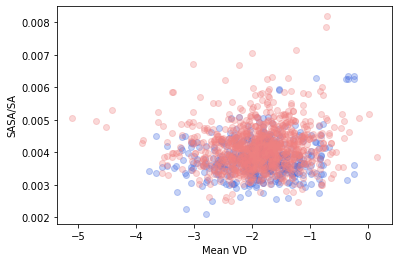

In [188]:
plt.scatter(sdabs_compare['mean_VD'],sdabs_compare['SASA/SA'],color='royalblue',alpha=0.3)
plt.scatter(abs_compare['mean_VD'],abs_compare['SASA/SA'],color='lightcoral',alpha=0.3)
plt.xlabel('Mean VD')
plt.ylabel('SASA/SA')

- not really any correlation between curvature (at least when represented by VD) and SASA
- compare epitopes at different ends of the SASA scale because when comparing SASA distributions of sdAbs and Abs it looks like there might be a difference there, just might not represent curvature in same way as VD/GC?

#### sample min and max values from SASA/SA for abs and sdabs

min sdabs (test if most concave)

In [189]:
sdabs_results_df.loc[sdabs_results_df['SASA/SA'] == np.min(sdabs_results_df['SASA/SA'])]

,Unnamed: 0.1,pdb,SASA total,epitope surface area,SASA/SA,Unnamed: 0
225,218,6dbf,7.349297,3485.34082,0.002109,281.0


In [190]:
abs_summary['epitope_arp'].loc[abs_summary['pdb']=='7lr3'].item()

"{'A': {'600': 'N', '603': 'E', '543': 'S', '602': 'K', '598': 'D', '599': 'S', '601': 'G', '539': 'Q', '595': 'I', '541': 'S', '565': 'R'}, 'B': {'565': 'R'}, 'AB': {'600': 'N', '603': 'E', '543': 'S', '602': 'K', '598': 'D', '599': 'S', '601': 'G', '539': 'Q', '595': 'I', '541': 'S', '565': 'R'}}"

max sdabs (test if most convex)

In [191]:
sdabs_results_df.loc[sdabs_results_df['SASA/SA'] == np.max(sdabs_results_df['SASA/SA'])]

,Unnamed: 0.1,pdb,SASA total,epitope surface area,SASA/SA,Unnamed: 0
100,93,5e7f,8.740979,1379.790894,0.006335,134.0


min abs

In [192]:
abs_results_df.loc[abs_results_df['SASA/SA'] == np.min(abs_results_df['SASA/SA'])]

,Unnamed: 0.1,pdb,SASA total,epitope surface area,SASA/SA,Unnamed: 0
698,694,7lr3,8.340856,3362.647949,0.00248,738.0


max abs

In [193]:
abs_results_df.loc[abs_results_df['SASA/SA'] == np.max(abs_results_df['SASA/SA'])]

,Unnamed: 0.1,pdb,SASA total,epitope surface area,SASA/SA,Unnamed: 0
695,691,4f37,8.814114,1077.402954,0.008181,735.0


- wondering what happens if large SASA and small SA/how much effect SA has
- if there a correlation between SASA and SA? 

Text(0, 0.5, 'SASA')

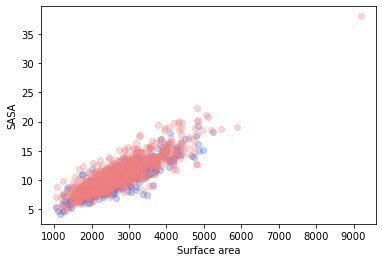

In [194]:
plt.scatter(sdabs_results_df['epitope surface area'],sdabs_results_df['SASA total'],color='royalblue',alpha=0.3)
plt.scatter(abs_results_df['epitope surface area'],abs_results_df['SASA total'],color='lightcoral',alpha=0.3)
plt.xlabel('Surface area')
plt.ylabel('SASA')

- one weird outlier
- but solid correlation between SASA and surface area, as SA increases so does SASA so correct to normalise for surface area of epitope

#### SASA all residues / SASA per residue

In [20]:
import ast

In [8]:
ast.literal_eval(abs_summary['epitope_arp'][0])['AB']

{'48': 'V',
 '52': 'R',
 '62': 'Y',
 '45': 'Y',
 '61': 'T',
 '49': 'L',
 '57': 'A',
 '56': 'G',
 '58': 'Q',
 '53': 'G',
 '55': 'P',
 '64': 'R',
 '60': 'I',
 '54': 'A'}

In [103]:
failed_sdabs = pd.DataFrame()
failed_sdabs['pdb'] = ['7oau','7oaq','7oaq','7oay','7nmu','7b27','7nkt']
failed_sdabs['ab_chain'] = ['BBB','AAA','FFF','A','AAA','AAA','AAA']
failed_sdabs['ag_chain'] = ['AAA','EEE','EEE','B','CCC','CCC','BBB']

In [10]:
failed_abs = pd.DataFrame()
failed_abs['pdb'] = ['4dn4','6yax','6t9d','6ss4','6ss2']
failed_abs['ab_chain'] = ['A+B','III+MMM','AAA+BBB','HHH+LLL','HHH+LLL']
failed_abs['ag_chain'] = ['C','BBB','DDD','AAA','AAA']

In [177]:
def get_epitope_sasa(pdb, summary_file, data_dir): #, ab, ag):

    sasa_all = []

    ab_chains = [chains for chains in summary_file['antibody_chain'].loc[summary_file['pdb'] == pdb]]
    ag_chains = [chains for chains in summary_file['antigen_chain'].loc[summary_file['pdb'] == pdb]] 

    ## get epitope residues from summary data
    epitope_res = []
    for i, s in enumerate(summary_file['epitope_arp'].loc[summary_file['pdb'] == pdb]):
        #print(i, s)
        epitope = ast.literal_eval(s)[''.join(ab_chains[i])]
        #print(type(epitope))
        epitope_res.append(str(epitope))

    for ab, ag, e in zip(ab_chains, ag_chains, epitope_res):

        #print(ab, ag, ast.literal_eval(e))
        all_chains = [ab,ag]
        #print(all_chains)
        all_chains_dict = {'Ab':ab, 'Ag':ag}
        print(all_chains_dict)
        
        cmd.reinitialize()
        pdbfile = str(data_dir + '/' + pdb + '.cif')
        
        try:
            cmd.load(pdbfile)
        except:
            cmd.fetch(pdb)

        # remove irrelevant chains and overwrite pdb to only include Ag and Ab complex of interest
        #print('relevant_chains', str(pdb + ' and chain ' + '+'.join([a for a in all_chains])))
        cmd.extract('relevant_chains', str(pdb + ' and chain ' + '+'.join([a for a in all_chains]))) # auth codes
        #print('Ag', str('relevant_chains' + ' and chain ' + '+'.join([a for a in ag])))
        cmd.create('Ag', str('relevant_chains' + ' and chain ' + '+'.join([a for a in ag]))) # separate Ag object
        #print('Ag', str('relevant_chains' + ' and chain ' + ag))
        #cmd.create('Ag', str('relevant_chains' + ' and chain ' + ag))

        # get sasa for all residues in epitope together
        #print('Ag and resi ' + '+'.join(ast.literal_eval(e).keys()))
        sasa_epi = cmd.get_sasa_relative('Ag and resi ' + '+'.join(ast.literal_eval(e).keys()))
        sasa_epi = np.sum(list(sasa_epi.values()))
        print(sasa_epi)

        # get sasa for all epitope residues as if they were individual surfaces
        # NOTE if using get_sasa_relative since 1 = completely exposed and 0 = completely buried, can just assume all residues if individually have SASA =1, so just add up number of epitope residues
        sasa_indiv = len(ast.literal_eval(e)) # equiv to number of residues
        print(sasa_indiv)
        
        sasa_rel = sasa_epi / sasa_indiv
        sasa_all.append([pdb, sasa_epi, sasa_indiv, sasa_rel])

    return sasa_all

In [178]:
epitope_res = [str(e) for e in [{'62':'H','63':'W','104':'A','105':'Y','150':'R','151':'F','191':'S','192':'L','193':'A','233':'C','235':'F','277':'S','278':'F','319':'G','320':'V'},
                {'118':'D','120':'I','138':'E','139':'L','140':'A','141':'G','142':'H','143':'T','174':'G','175':'Q','177':'T','178':'T'},
                {'3':'E','4':'L','5':'D','6':'Q','7':'L','8':'R','9':'Q','10':'E','11':'A','12':'E','13':'Q','14':'L'}]]

get_epitope_sasa('6b20', sdabs_summary, sdabs_filepath, epitope_res=epitope_res)

{'Ab': 'F', 'Ag': 'A'}
 ExecutiveLoad-Detail: Detected mmCIF
1.9951053935500491
15
{'Ab': 'F', 'Ag': 'A'}
 ExecutiveLoad-Detail: Detected mmCIF
4.581043892267923
12
{'Ab': 'F', 'Ag': 'A'}
 ExecutiveLoad-Detail: Detected mmCIF
6.961113658301491
12
[['6b20', 1.9951053935500491, 15, 0.13300702623666993], ['6b20', 4.581043892267923, 12, 0.38175365768899355], ['6b20', 6.961113658301491, 12, 0.5800928048584576]]


[['6b20', 1.9951053935500491, 15, 0.13300702623666993],
 ['6b20', 4.581043892267923, 12, 0.38175365768899355],
 ['6b20', 6.961113658301491, 12, 0.5800928048584576]]

In [179]:
sdabs_results_df.loc[sdabs_results_df['pdb'] == '6b20']

,Unnamed: 0,pdb,SASA epitope surface,SASA individual residues,SASA epitope/individual
221,286.0,6b20,7.044026,21,0.33543


In [91]:
def get_epitope_sasa_fails(pdb, summary_file, data_dir, ab, ag):

    sasa_all = []

    ## get epitope residues from summary data
    epitope_res = []
    for i, s in enumerate(summary_file['epitope_arp'].loc[summary_file['pdb'] == pdb]):
        #print(i, s)
        epitope = ast.literal_eval(s)#[''.join(ab_chains[i])]
        #print(type(epitope))
        epitope_res.append(str(epitope))
    
    #print(epitope_res)

    for e in epitope_res:
        #print(ab, ag, ast.literal_eval(e))
        all_chains = [ab,ag]
        #print(all_chains)
        all_chains_dict = {'Ab':ab, 'Ag':ag}
        print(all_chains_dict)
        
        cmd.reinitialize()
        pdbfile = str(data_dir + '/' + pdb + '.cif')
        
        try:
            cmd.load(pdbfile)
        except:
            cmd.fetch(pdb)

        print([a for a in all_chains])
        # remove irrelevant chains and overwrite pdb to only include Ag and Ab complex of interest
        print('relevant_chains', str(pdb + ' and chain ' + '+'.join(all_chains)))
        cmd.extract('relevant_chains', str(pdb + ' and chain ' + '+'.join(all_chains))) # auth codes
        #print('Ag', str('relevant_chains' + ' and chain ' + '+'.join([a for a in ag])))
        #cmd.create('Ag', str('relevant_chains' + ' and chain ' + '+'.join([a for a in ag]))) # separate Ag object
        print('Ag', str('relevant_chains' + ' and chain ' + ag))
        cmd.create('Ag', str('relevant_chains' + ' and chain ' + ag))

        # get sasa for all residues in epitope together
        #print('Ag and resi ' + '+'.join(ast.literal_eval(e).keys()))
        sasa_epi = cmd.get_sasa_relative('Ag and resi ' + '+'.join(ast.literal_eval(e).keys()))
        #print(sasa_epi)
        sasa_epi = np.sum(list(sasa_epi.values()))
        print(sasa_epi)

        # get sasa for all epitope residues as if they were individual surfaces
        # NOTE if using get_sasa_relative since 1 = completely exposed and 0 = completely buried, can just assume all residues if individually have SASA =1, so just add up number of epitope residues
        sasa_indiv = len(ast.literal_eval(e)) # equiv to number of residues
        print(sasa_indiv)
        
        sasa_rel = sasa_epi / sasa_indiv
        sasa_all.append([pdb, sasa_epi, sasa_indiv, sasa_rel])

    return sasa_all

In [51]:
abs_results = []
# failed_abs = []

for i, row in enumerate(abs_summary.iterrows()):
    if row[1]['pdb'] in list(failed_abs['pdb']):
        print(row[1]['pdb'])
    # try:
        sasa_all = get_epitope_sasa_fails(row[1]['pdb'], abs_summary, abs_filepath,
                ab=failed_abs['ab_chain'].loc[failed_abs['pdb'] == row[1]['pdb']].item(), 
                ag=failed_abs['ag_chain'].loc[failed_abs['pdb'] == row[1]['pdb']].item())
        for s in sasa_all:
            print(s)
            abs_results.append(s)
    # except:
    #     failed_abs.append(row)

4dn4
{'48': 'A', '51': 'I', '19': 'K', '47': 'V', '45': 'T', '24': 'R', '46': 'I', '18': 'R', '20': 'I', '49': 'K', '21': 'S'}
{'Ab': 'A+B', 'Ag': 'C'}
 ExecutiveLoad-Detail: Detected mmCIF
relevant_chains 4dn4 and chain A+B+C
Ag relevant_chains and chain C
defaultdict(<class 'float'>, {})
0.0
11
['4dn4', 0.0, 11, 0.0]
6yax
{'158': 'K', '201': 'G', '205': 'Y', '203': 'T', '199': 'N', '162': 'K', '132': 'W', '204': 'L', '202': 'Y', '156': 'K'}
{'Ab': 'III+MMM', 'Ag': 'BBB'}
 ExecutiveLoad-Detail: Detected mmCIF
relevant_chains 6yax and chain III+MMM+BBB
Ag relevant_chains and chain BBB
defaultdict(<class 'float'>, {('Ag', 'F', 'BBB', '132'): 0.3406864282127729, ('Ag', 'F', 'BBB', '156'): 0.6014323448486851, ('Ag', 'F', 'BBB', '158'): 0.2641168276328974, ('Ag', 'F', 'BBB', '162'): 0.3869896174484742, ('Ag', 'F', 'BBB', '199'): 0.17086923617594538, ('Ag', 'F', 'BBB', '201'): 0.6924493378147026, ('Ag', 'F', 'BBB', '202'): 0.9713577016574392, ('Ag', 'F', 'BBB', '203'): 0.5179648741689908, (

In [53]:
abs_results_fixed = pd.DataFrame()
abs_results_fixed['pdb'] = [abs_results[i][0] for i in range(len(abs_results))]
abs_results_fixed['SASA epitope surface'] = [abs_results[i][1] for i in range(len(abs_results))]
abs_results_fixed['SASA individual residues'] = [abs_results[i][2] for i in range(len(abs_results))]
abs_results_fixed['SASA epitope/individual'] = [abs_results[i][3] for i in range(len(abs_results))]

In [57]:
abs_results_df.to_csv('Abs_SASA_shape.csv')

In [104]:
sdabs_results = []
failed_abs2 = []

for row in failed_sdabs.iterrows():
        sasa_all = get_epitope_sasa_fails(row[1]['pdb'], sdabs_summary, sdabs_filepath, row[1]['ab_chain'], row[1]['ag_chain'])
        for s in sasa_all:
                print(s)
                sdabs_results.append(s)

{'Ab': 'BBB', 'Ag': 'AAA'}
 ExecutiveLoad-Detail: Detected mmCIF
['BBB', 'AAA']
relevant_chains 7oau and chain BBB+AAA
Ag relevant_chains and chain AAA


4.970084245654622
12
['7oau', 4.970084245654622, 12, 0.41417368713788516]
{'Ab': 'AAA', 'Ag': 'EEE'}
 ExecutiveLoad-Detail: Detected mmCIF
['AAA', 'EEE']
relevant_chains 7oaq and chain AAA+EEE
Ag relevant_chains and chain EEE
6.109037136271238
17
{'Ab': 'AAA', 'Ag': 'EEE'}
 ExecutiveLoad-Detail: Detected mmCIF
['AAA', 'EEE']
relevant_chains 7oaq and chain AAA+EEE
Ag relevant_chains and chain EEE
6.76010116621699
15
['7oaq', 6.109037136271238, 17, 0.359355125663014]
['7oaq', 6.76010116621699, 15, 0.4506734110811327]
{'Ab': 'FFF', 'Ag': 'EEE'}
 ExecutiveLoad-Detail: Detected mmCIF
['FFF', 'EEE']
relevant_chains 7oaq and chain FFF+EEE
Ag relevant_chains and chain EEE
6.109037136271238
17
{'Ab': 'FFF', 'Ag': 'EEE'}
 ExecutiveLoad-Detail: Detected mmCIF
['FFF', 'EEE']
relevant_chains 7oaq and chain FFF+EEE
Ag relevant_chains and chain EEE
6.76010116621699
15
['7oaq', 6.109037136271238, 17, 0.359355125663014]
['7oaq', 6.76010116621699, 15, 0.4506734110811327]
{'Ab': 'A', 'Ag': 'B'}
 Executiv

In [101]:
sdabs_results

[['7oau', 4.970084245654622, 12, 0.41417368713788516],
 ['7oaq', 6.109037136271238, 17, 0.359355125663014],
 ['7oaq', 6.76010116621699, 15, 0.4506734110811327],
 ['7oaq', 6.109037136271238, 17, 0.359355125663014],
 ['7oaq', 6.76010116621699, 15, 0.4506734110811327],
 ['7oay', 0.0, 15, 0.0],
 ['7nmu', 3.847322809618681, 14, 0.2748087721156201],
 ['7b27', 0.0, 16, 0.0],
 ['7nkt', 0.0, 18, 0.0]]

In [105]:
sdabs_results_fixed = pd.DataFrame()
sdabs_results_fixed['pdb'] = [sdabs_results[i][0] for i in range(len(sdabs_results))]
sdabs_results_fixed['SASA epitope surface'] = [sdabs_results[i][1] for i in range(len(sdabs_results))]
sdabs_results_fixed['SASA individual residues'] = [sdabs_results[i][2] for i in range(len(sdabs_results))]
sdabs_results_fixed['SASA epitope/individual'] = [sdabs_results[i][3] for i in range(len(sdabs_results))]

In [107]:
sdabs_results_fixed = sdabs_results_fixed.loc[sdabs_results_fixed['SASA epitope surface'] > 0]

In [9]:
sdabs_results_df = pd.read_csv('sdAbs_SASA_shape.csv')

In [10]:
abs_results_df = pd.read_csv('Abs_SASA_shape.csv')

In [ ]:
# abs 4dn4, sdabs 7oay, 7b27, 7nkt couldnt figure out how to debug - cmd/pymol/auth code recognising problem 

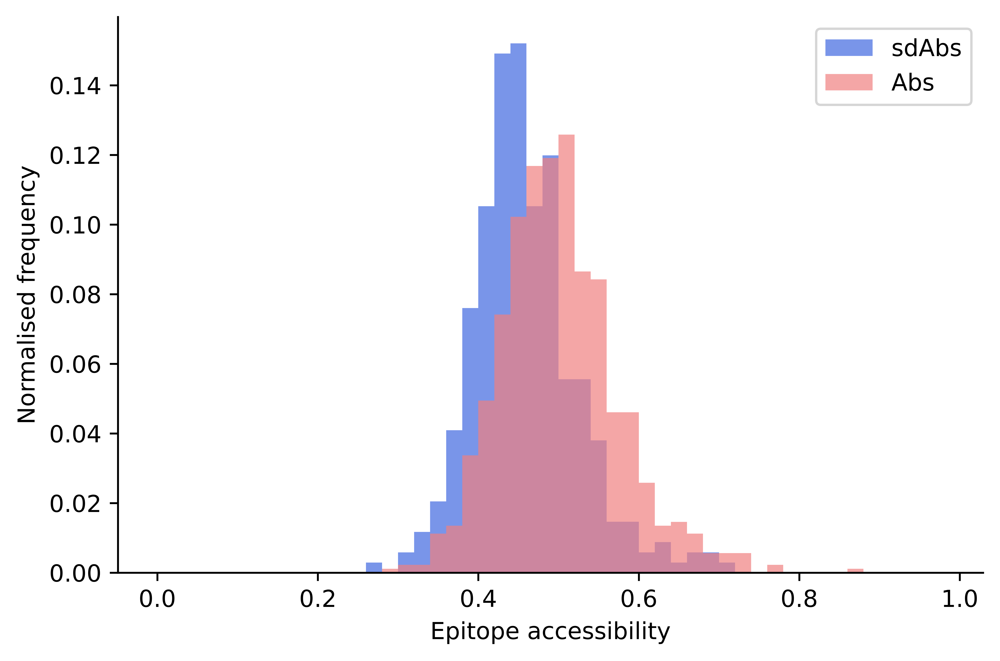

In [11]:
bins = np.arange(0, 1, 0.02)

plt.figure()
plt.hist(sdabs_results_df['SASA epitope/individual'], bins=bins, label='sdAbs', alpha=0.7, color='royalblue', weights=np.zeros_like(sdabs_results_df['SASA epitope/individual']) + 1. / len(sdabs_results_df['SASA epitope/individual']))
plt.hist(abs_results_df['SASA epitope/individual'], bins=bins, label='Abs', alpha=0.7, color='lightcoral', weights=np.zeros_like(abs_results_df['SASA epitope/individual']) + 1. / len(abs_results_df['SASA epitope/individual']))
plt.xlabel('Epitope accessibility')
plt.ylabel('Normalised frequency')
plt.legend()
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

In [21]:
sdabs_results_df.loc[sdabs_results_df['pdb'] == '6b20']

,Unnamed: 0.1,Unnamed: 0,pdb,SASA epitope surface,SASA individual residues,SASA epitope/individual
215,221,286.0,6b20,7.044026,21,0.33543


bootstrap 

In [22]:
zoutput_meanvd = ztest(sdabs_results_df['SASA epitope/individual'], abs_results_df['SASA epitope/individual'], value=0) 
print(f"ztest continuity percentage: {zoutput_meanvd}")

ztest continuity percentage: (-9.37917934551853, 6.648819830796751e-21)


In [23]:
dict_lengths_meanvd = {'sdAbs': sdabs_results_df['SASA epitope/individual'],
                     'Abs': abs_results_df['SASA epitope/individual']}
perform_bootstrap(300, dict_lengths_meanvd)

DABEST v2023.02.14
                  
Good evening!
The current time is Tue Jun 20 21:37:34 2023.

The unpaired mean difference between sdAbs and Abs is 0.0425 [95%CI 0.0312, 0.0543].
The p-value of the two-sided permutation t-test is 0.0, calculated for legacy purposes only. 

5000 bootstrap samples were taken; the confidence interval is bias-corrected and accelerated.
Any p-value reported is the probability of observing theeffect size (or greater),
assuming the null hypothesis ofzero difference is true.
For each p-value, 5000 reshuffles of the control and test labels were performed.

To get the results of all valid statistical tests, use `.mean_diff.statistical_tests`


In [24]:
sdabs_compare = sdabs_vd[['pdb','mean_VD']].merge(sdabs_results_df[['pdb','SASA epitope/individual']], how='outer', on='pdb').drop_duplicates()
abs_compare = abs_vd[['pdb','mean_VD']].merge(abs_results_df[['pdb','SASA epitope/individual']], how='outer', on='pdb').drop_duplicates()

Text(0.5, 0, 'SASA of epitope surface/total SASA of epitope residues')

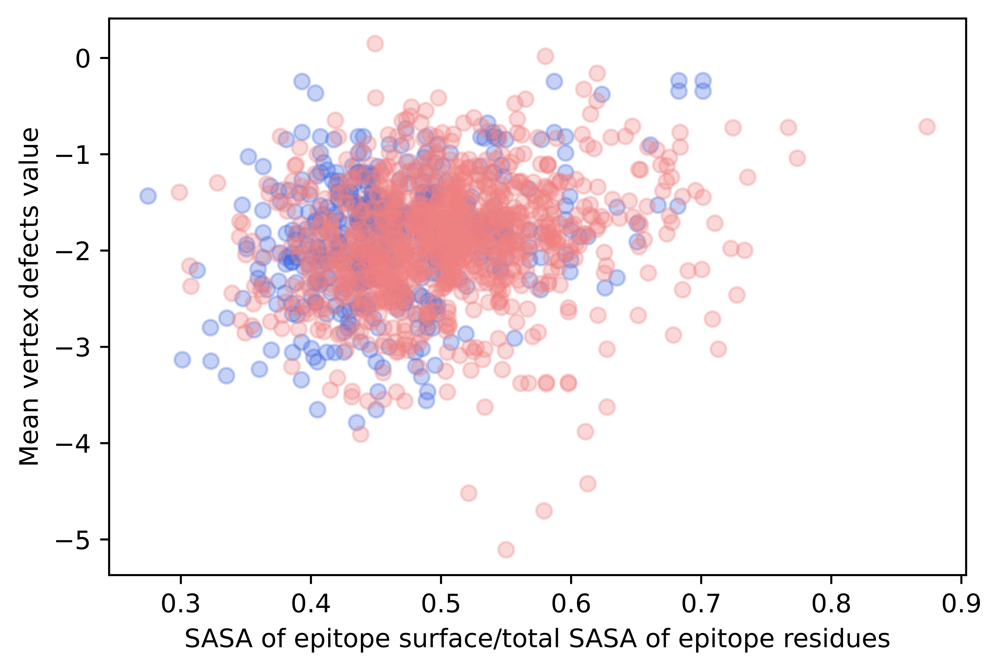

In [25]:
plt.scatter(sdabs_compare['SASA epitope/individual'],sdabs_compare['mean_VD'],color='royalblue',alpha=0.3)
plt.scatter(abs_compare['SASA epitope/individual'],abs_compare['mean_VD'],color='lightcoral',alpha=0.3)
plt.ylabel('Mean vertex defects value')
plt.xlabel('SASA of epitope surface/total SASA of epitope residues')

h3 length vs sasa curvature

In [26]:
def get_cdr(summary_df, cdr_col):

    cdrhs = []
    lengths = []
    for row in summary_df['cdr_sequence']:
        row = ast.literal_eval(row)
        cdrh3 = row[cdr_col]
        cdrhs.append(cdrh3)
        lengths.append(len(cdrh3))
    
    return cdrhs, lengths

In [27]:
sdabs_seqs, sdabs_lengths = get_cdr(sdabs_summary, 'CDRH3')
abs_seqs, abs_lengths = get_cdr(abs_summary, 'CDRH3')

In [28]:
abs_h3 = pd.DataFrame()
abs_h3['pdb'] = abs_summary['pdb']
abs_h3['cdrh3 seq'] = abs_seqs
abs_h3['cdrh3 len'] = abs_lengths

In [29]:
sdabs_h3 = pd.DataFrame()
sdabs_h3['pdb'] = sdabs_summary['pdb']
sdabs_h3['cdrh3 seq'] = sdabs_seqs
sdabs_h3['cdrh3 len'] = sdabs_lengths

In [30]:
sdabs_plot = sdabs_results_df.merge(sdabs_h3, on='pdb').drop_duplicates(subset='SASA epitope surface')

In [31]:
sdabs_plot.loc[sdabs_plot['pdb'] == '6b20']

,Unnamed: 0.1,Unnamed: 0,pdb,SASA epitope surface,SASA individual residues,SASA epitope/individual,cdrh3 seq,cdrh3 len
327,221,286.0,6b20,7.044026,21,0.33543,NVGRSRGY,8


In [32]:
abs_plot = abs_results_df.merge(abs_h3, on='pdb').drop_duplicates(subset='SASA epitope surface')

In [33]:
abs_plot

,Unnamed: 0.1,Unnamed: 0,pdb,SASA epitope surface,SASA individual residues,SASA epitope/individual,cdrh3 seq,cdrh3 len
0,0,0.0,7mdj,7.243789,14,0.517413,ARERGDGYFDY,11
1,1,1.0,7sem,7.638259,17,0.449309,ARARATGYSSITPYFDI,17
2,2,2.0,7jmo,9.302615,21,0.442982,ARDLERAGGMDV,12
3,3,3.0,7orb,6.054968,13,0.465767,ARDVVVVVAARNHYYNGMDV,20
5,4,4.0,7orb,5.047705,10,0.504770,ARDVVVVVAARNHYYNGMDV,20
...,...,...,...,...,...,...,...,...
1007,889,1011.0,4lsv,10.803847,20,0.540192,ARQRSDYWDFDV,12
1008,1,NaN,6yax,4.913787,10,0.491379,ARENFDAFDV,10
1009,2,NaN,6t9d,6.829863,16,0.426866,ARDDGYFDT,9
1010,3,NaN,6ss4,8.154053,16,0.509628,ARLRADLGLYMDL,13


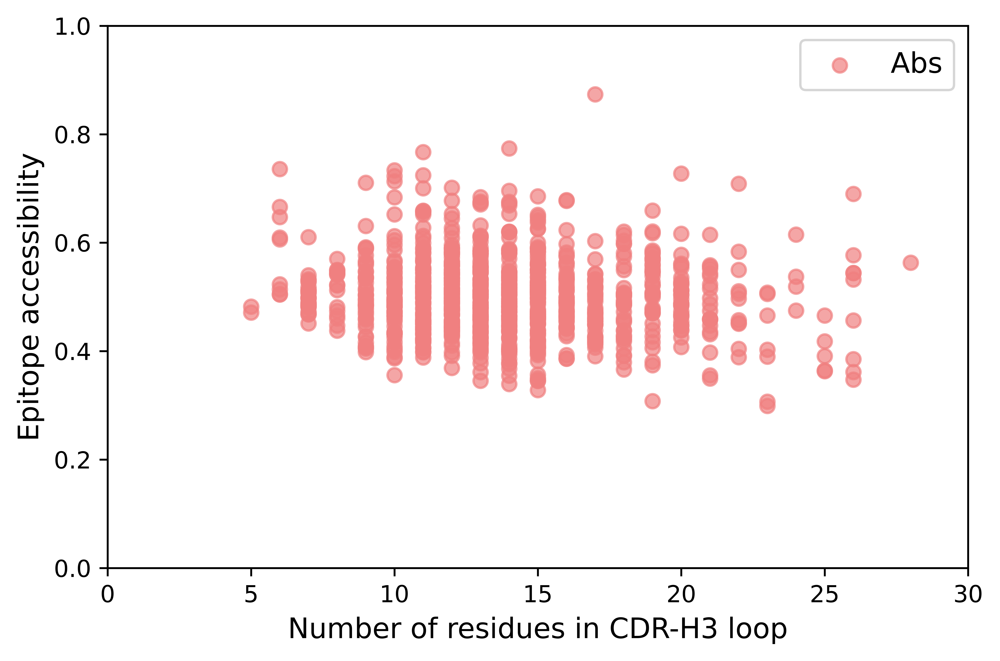

In [34]:
plt.figure()
plt.scatter(abs_plot['cdrh3 len'], abs_plot['SASA epitope/individual'], label='Abs', color='lightcoral', alpha=0.7)
plt.xlabel('Number of residues in CDR-H3 loop', fontsize=12)
plt.ylabel('Epitope accessibility', fontsize=12)
plt.xlim(0,30,5)
plt.ylim(0,1, 0.1)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

In [41]:
np.corrcoef(np.array(abs_plot['cdrh3 len']), np.array(abs_plot['SASA epitope/individual']))

array([[ 1.        , -0.09670456],
       [-0.09670456,  1.        ]])

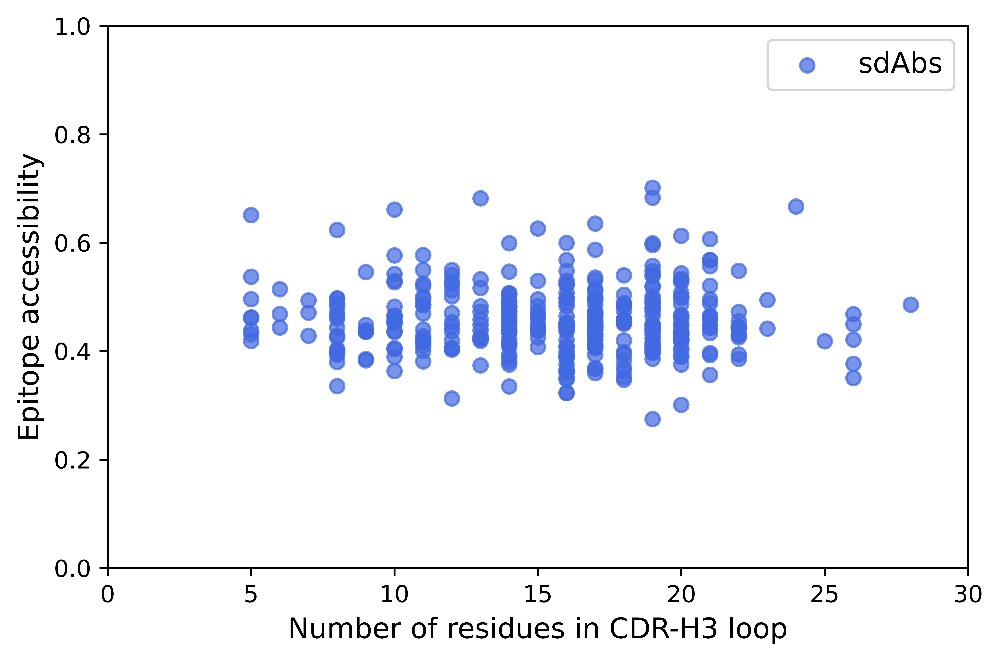

In [40]:
plt.figure()
plt.scatter(sdabs_plot['cdrh3 len'], sdabs_plot['SASA epitope/individual'], label='sdAbs', color='royalblue', alpha=0.7)
plt.xlabel('Number of residues in CDR-H3 loop', fontsize=12)
plt.ylabel('Epitope accessibility', fontsize=12)
plt.xlim(0,30,5)
plt.ylim(0,1, 0.1)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

In [42]:
np.corrcoef(np.array(sdabs_plot['cdrh3 len']), np.array(sdabs_plot['SASA epitope/individual']))

array([[ 1.        , -0.02104401],
       [-0.02104401,  1.        ]])

Plot SASA 'curvature' vs timestamp of structures

In [36]:
import os

In [37]:
from Bio.PDB.MMCIFParser import MMCIFParser
parser = MMCIFParser(QUIET=True)

In [38]:
def get_timestamp(pdb_dir):

    timestamps = []
    for entry in os.listdir(pdb_dir):
        structure = parser.get_structure(entry, str(pdb_dir + '/' + entry))
        timestamp = structure.header['deposition_date']
        timestamps.append(timestamp[0:4]) # just get year
    
    return timestamps

In [39]:
abs_timestamps = get_timestamp('/Users/gemmagordon/Documents/OXFORD/OPIG YEAR 1/BindingSiteProject/nbs_vs_abs/BindingSiteComparison_ipynbs_in_paper/vertex_defects_analysis/temp_pdb_cif_abs')
sdabs_timestamps = get_timestamp('/Users/gemmagordon/Documents/OXFORD/OPIG YEAR 1/BindingSiteProject/nbs_vs_abs/BindingSiteComparison_ipynbs_in_paper/vertex_defects_analysis/temp_pdb_cif_nbs')
# check number of files in cif directories
print(len(os.listdir('/Users/gemmagordon/Documents/OXFORD/OPIG YEAR 1/BindingSiteProject/nbs_vs_abs/BindingSiteComparison_ipynbs_in_paper/vertex_defects_analysis/temp_pdb_cif_abs')))
print(len(os.listdir('/Users/gemmagordon/Documents/OXFORD/OPIG YEAR 1/BindingSiteProject/nbs_vs_abs/BindingSiteComparison_ipynbs_in_paper/vertex_defects_analysis/temp_pdb_cif_nbs')))

KeyboardInterrupt: 

In [ ]:
# Add timestamp and epitope shape data together
abs_pdbs = sorted(os.listdir('/Users/gemmagordon/Documents/OXFORD/OPIG YEAR 1/BindingSiteProject/nbs_vs_abs/BindingSiteComparison_ipynbs_in_paper/vertex_defects_analysis/temp_pdb_cif_abs'))
sdabs_pdbs = sorted(os.listdir('/Users/gemmagordon/Documents/OXFORD/OPIG YEAR 1/BindingSiteProject/nbs_vs_abs/BindingSiteComparison_ipynbs_in_paper/vertex_defects_analysis/temp_pdb_cif_nbs'))
abs_pdbs = [a[0:4] for a in abs_pdbs]
sdabs_pdbs = [s[0:4] for s in sdabs_pdbs]

In [ ]:
# Create df of PDB ID, timestamp and epitope shape (mean VD)
abs_time_results = pd.DataFrame()
sdabs_time_results = pd.DataFrame()
abs_time_results['pdb'] = abs_pdbs
abs_time_results['Timestamp'] = abs_timestamps
sdabs_time_results['pdb'] = sdabs_pdbs
sdabs_time_results['Timestamp'] = sdabs_timestamps

In [ ]:
sdabs_merge = pd.merge(sdabs_time_results, sdabs_results_df, on="pdb")
abs_merge = pd.merge(abs_time_results, abs_results_df, on="pdb")
sdabs_merge = sdabs_merge.loc[sdabs_merge['Timestamp'] != '']
abs_merge = abs_merge.loc[abs_merge['Timestamp'] != ''] # bug where one timestamp missing

Plot timestamps vs epitope shape

In [ ]:
def plot_results(df, meanSASA, colour, label):

    plt.figure()
    plt.scatter([int(i) for i in df['Timestamp']], df['SASA epitope/individual'], label=label, alpha=0.5, color=colour)
    plt.xlabel('Timestamp', fontsize=12)
    plt.ylabel('SASA of epitope surface/total SASA of epitope residues', fontsize=12)
    plt.ylim(0, 1, 1)
    plt.legend(fontsize=12)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.tight_layout()

    # plot baseline (average mean VD)
    plt.axhline(meanSASA, color='black', linestyle='--')

    plt.show()

    return

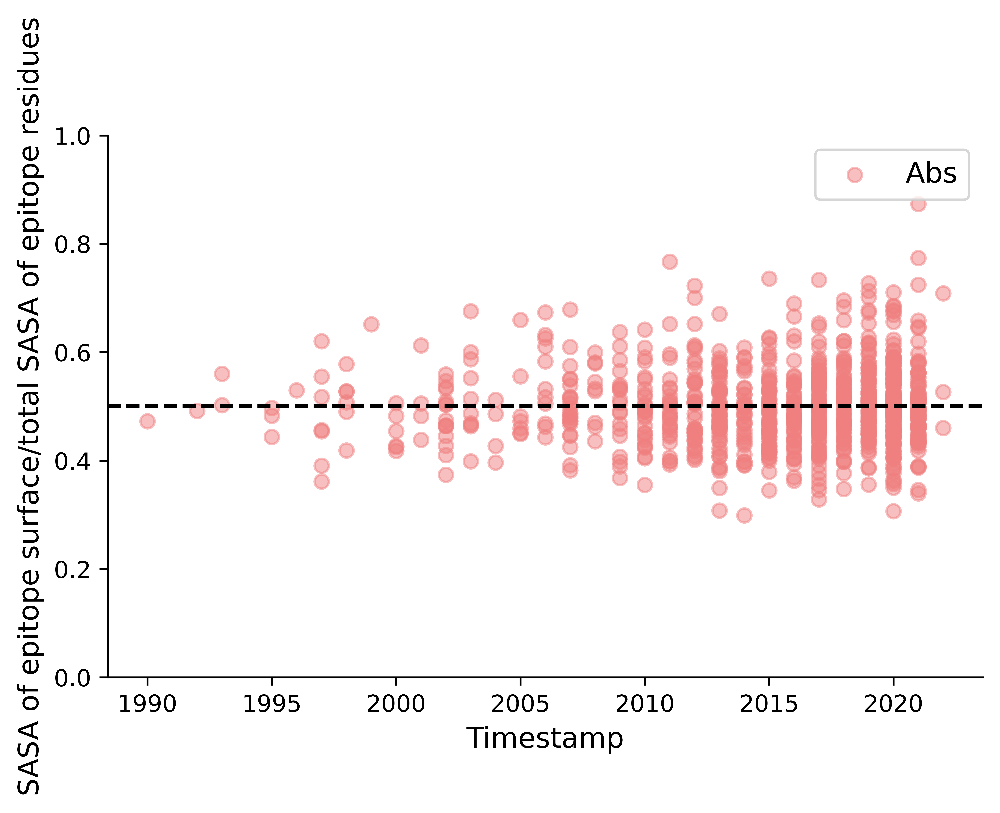

In [ ]:
plot_results(abs_merge, abs_results_df['SASA epitope/individual'].describe()[1], 'lightcoral', 'Abs')

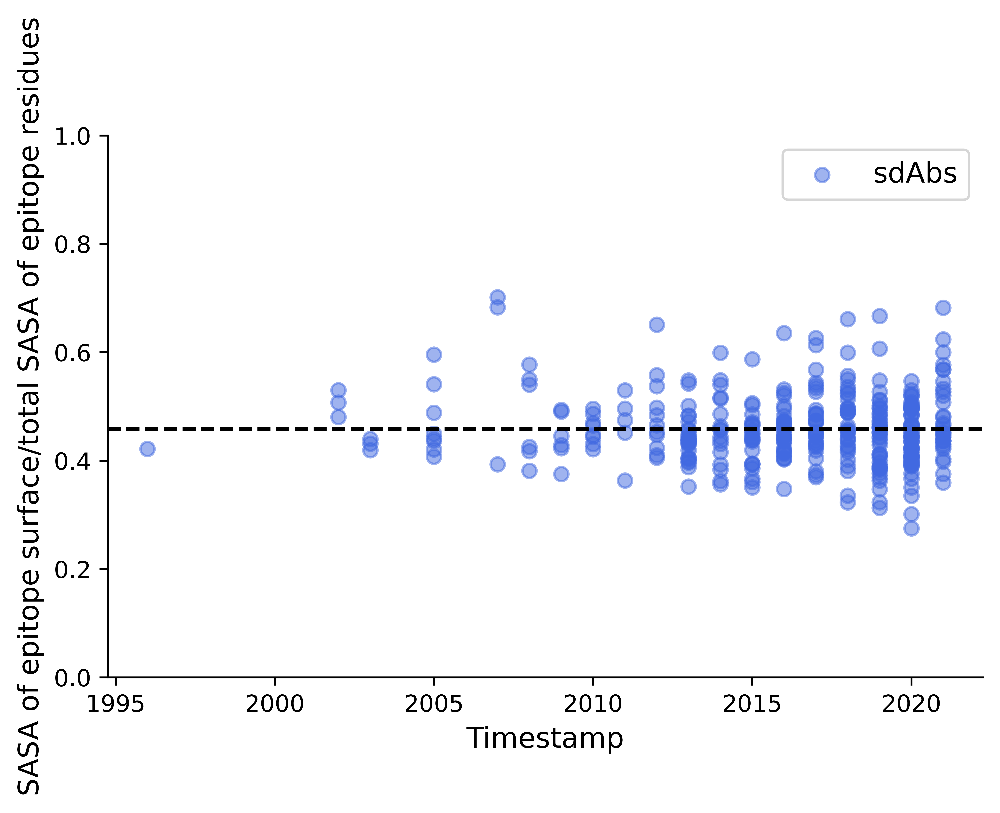

In [ ]:
plot_results(sdabs_merge, sdabs_results_df['SASA epitope/individual'].describe()[1], 'royalblue', 'sdAbs')